In [61]:
import numpy as np
import pandas as pd
import os

fpath = './archive/images/Images'
# Print the classes of dogs
print(os.listdir(fpath))
dog_classes = os. listdir(fpath)

['n02097658-silky_terrier', 'n02092002-Scottish_deerhound', 'n02099849-Chesapeake_Bay_retriever', 'n02091244-Ibizan_hound', 'n02095314-wire-haired_fox_terrier', 'n02091831-Saluki', 'n02102318-cocker_spaniel', 'n02104365-schipperke', 'n02090622-borzoi', 'n02113023-Pembroke', 'n02105505-komondor', 'n02093256-Staffordshire_bullterrier', 'n02113799-standard_poodle', 'n02109961-Eskimo_dog', 'n02089973-English_foxhound', 'n02099601-golden_retriever', 'n02095889-Sealyham_terrier', 'n02085782-Japanese_spaniel', 'n02097047-miniature_schnauzer', 'n02110063-malamute', 'n02105162-malinois', 'n02086079-Pekinese', 'n02097130-giant_schnauzer', 'n02113978-Mexican_hairless', 'n02107142-Doberman', 'n02097209-standard_schnauzer', 'n02115913-dhole', 'n02106662-German_shepherd', 'n02106382-Bouvier_des_Flandres', 'n02110185-Siberian_husky', 'n02094258-Norwich_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02109525-Saint_Bernard', 'n02093754-Border_terrier', 'n02105251-briard', 'n0210855

In [62]:
# Get the dog Labels
# Get only the labels by splitting the folder name at hyphen
breeds = [breed.split('-', 1)[1] for breed in dog_classes]

breeds[:10]

['silky_terrier',
 'Scottish_deerhound',
 'Chesapeake_Bay_retriever',
 'Ibizan_hound',
 'wire-haired_fox_terrier',
 'Saluki',
 'cocker_spaniel',
 'schipperke',
 'borzoi',
 'Pembroke']

In [63]:
# Get images full path and their Labels
# X will have full address of each image
X = []
# y will have its breed name
y = []
fullpaths = [os.path.join('./archive/images/Images', dog_class)
             for dog_class in dog_classes]
for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append(os.path.join(fullpath, imgname))
        y.append(breeds[counter])

print(X[:10], "\n")
print(y[:10], "\n")

print(len(X))

['./archive/images/Images/n02097658-silky_terrier/n02097658_26.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_4869.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_595.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_9222.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_422.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1326.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_7970.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_10567.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1469.jpg', './archive/images/Images/n02097658-silky_terrier/n02097658_1086.jpg'] 

['silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier', 'silky_terrier'] 

20580


In [83]:
import random
# Random shuffle the images
combined = list(zip(X, y))
random.shuffle(combined)

# Modify the X and y lists to get the shuffled images
X[:], y[:] = zip(*combined)

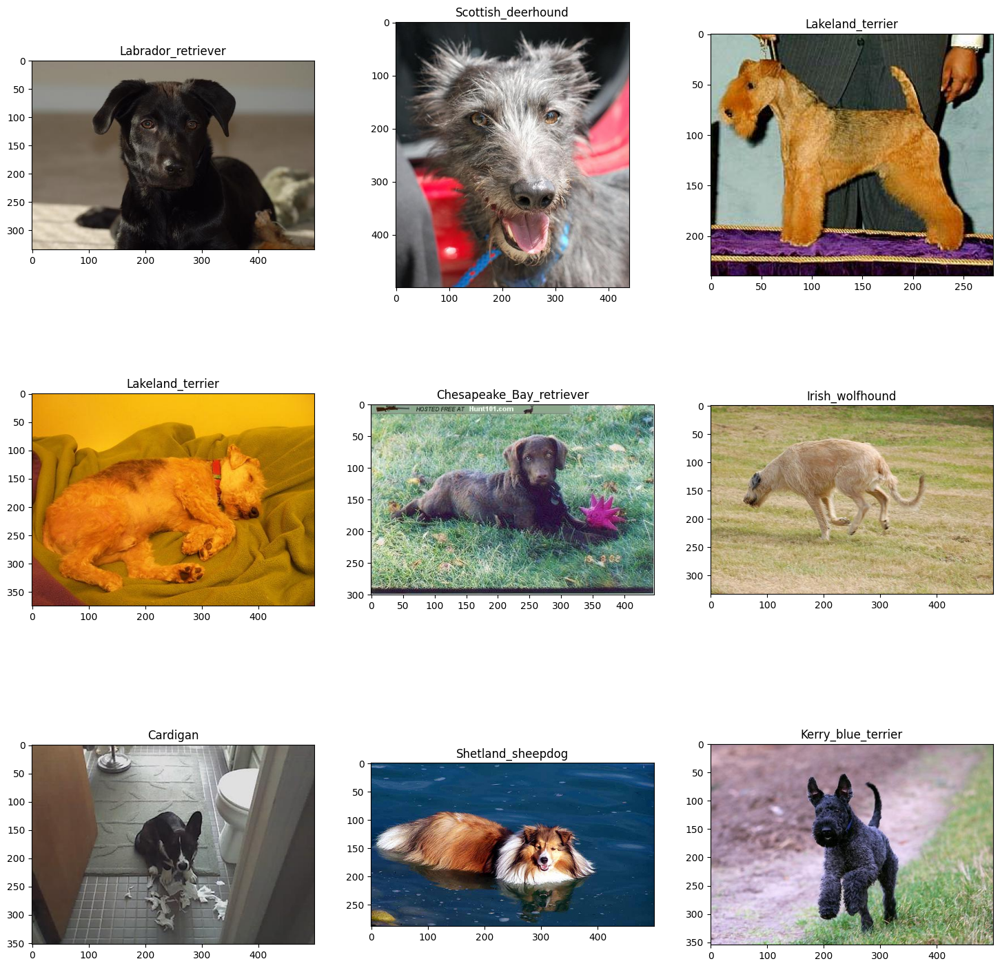

In [65]:
# Display random dogs pictures
import matplotlib.pyplot as plt
from matplotlib. image import imread
plt.figure(figsize=(18, 18))

for counter, i in enumerate(random.sample(range(0, len(X)), 9)):
    plt.subplot(3, 3, counter+1)
    plt.subplots_adjust(hspace=0.3)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=12)
plt.show()

In [85]:
x = X[:2000]
y = y[:2000]

Encoding data is essential for the target variable. As we have a multiclass classification, we use one-hot encoding, so that for each image, there will be 120 columns (total number of breeds), with all but 1 column with a value of 0. The only column with a value of 1 is the image's associated breed.


In [86]:
# Convert Labels to one-hot encoded Labels
from sklearn.preprocessing import LabelEncoder
from keras. utils import to_categorical

# Label and one-hot encoding y Labels
le = LabelEncoder()
le.fit(y)
y_encoded = to_categorical(le.transform(y), len(breeds))
print(y_encoded.shape)
y_encoded = np.array(y_encoded)

(1000, 120)


We load the images to the same dimensions and convert them into an image array, each containing the rgb values of every pixel. It's important to convert the images into a dimension that the pre-trained model is expecting. In this case, we use the InceptionV3 model, which expects images of size 299x299.


In [68]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img

# Load, resize images, and store as array
img_data = np.array(
    [img_to_array(load_img(img, target_size=(299, 299))) for img in x])
print(img_data.shape)

X_train, X_test, y_train, y_test = train_test_split(
    img_data, y_encoded, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

print('Training Dataset Size:', X_train.shape)
print('Validation Dataset Size:', X_val.shape)
print('Testing Dataset Size:', X_test.shape)
print('Training Label Size:', y_train.shape)
print('Validation Label Size:', y_val.shape)
print('Testing Label Size:', y_test.shape)

(1000, 299, 299, 3)
Training Dataset Size: (640, 299, 299, 3)
Validation Dataset Size: (160, 299, 299, 3)
Testing Dataset Size: (200, 299, 299, 3)
Training Label Size: (640, 120)
Validation Label Size: (160, 120)
Testing Label Size: (200, 120)


### Data Augmentation

We also perform data augmentation, to get more diverse data without collecting them. This works by applying some transformation to them (rotation, flipping) to produce new versions of the existing ones. This is done to prevent overfitting, as the model will be trained on more diverse data.

In [87]:
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

# Create train generator
# Using only preprocess_input because using pretrained models . use rescale=1./255 if training from scratch
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=30,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   horizontal_flip=True)

train_generator = train_datagen.flow(X_train, y_train, batch_size=32)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_generator = val_datagen.flow(X_val, y_val, batch_size=32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


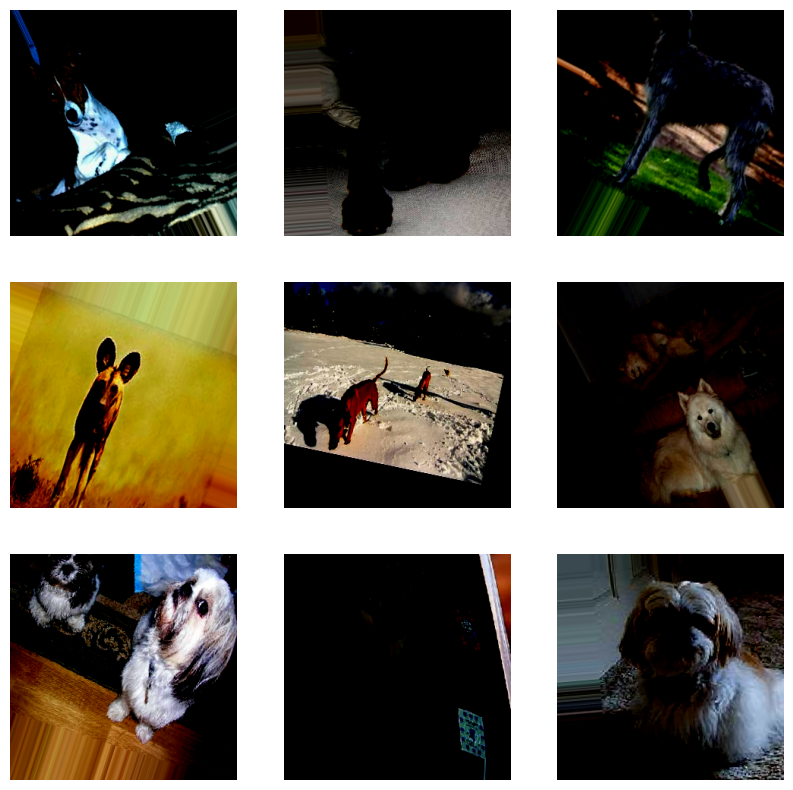

In [100]:
# Create augmented images
augmented_images = train_datagen.flow(X_train, y_train, batch_size=1)

# Plot augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented_image = augmented_images.next()[0][0]
    plt.subplot(3, 3, i+1)
    plt.imshow(augmented_image)
    plt.axis('off')
plt.show()


Model Building The next part is building the model. For this process, we are using Google's Inception V3 model. There are other models available to use in Keras as well. We remove the last layer of the Inception V3 model, and feed the output of it to our own set of layers, ending with a final Dense layer to classify or predict which of the 120 breeds the images belong to. We also freeze the initial Inception V3 model as it has already been trained before and compile the model


In [101]:
from keras import models
from keras.optimizers.legacy import Adam
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.applications.inception_v3 import InceptionV3
from keras.utils import plot_model

# Load Inceptionv3 pre-trained model
base_model = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(299, 299, 3))
model = models.Sequential()
model.add(base_model)  # add pre-trained Layers
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(len(breeds), activation='softmax'))

# Freeze pre-trained Layers
print("Number of trainable weights before freezing the base layer:",
      len(model.trainable_weights))
model.layers[0].trainable = False
print("Number of trainable weights after freezing the base layer:",
      len(model.trainable_weights))

Number of trainable weights before freezing the base layer: 194
Number of trainable weights after freezing the base layer: 6


In [102]:
model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   


 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d_3  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_3 (Dropout)         (None, 2048)              0         
                                                                 
 dense_9 (Dense)             (None, 512)               1049088   
                                                                 
 dense_10 (Dense)            (None, 512)               262656    
                                                                 
 dense_11 (Dense)            (None, 120)               61560     
                                                                 
Total params: 23176088 (88.41 MB)
Trainable params: 1373304 (5.24 MB)
Non-trainable params: 21802784 (83.17 MB)
______________________________

/Users/diegobolanos/miniconda/envs/tensorflow_metal/lib/python3.10/site-packages/keras/src/optimizers/legacy/adam.py:118: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


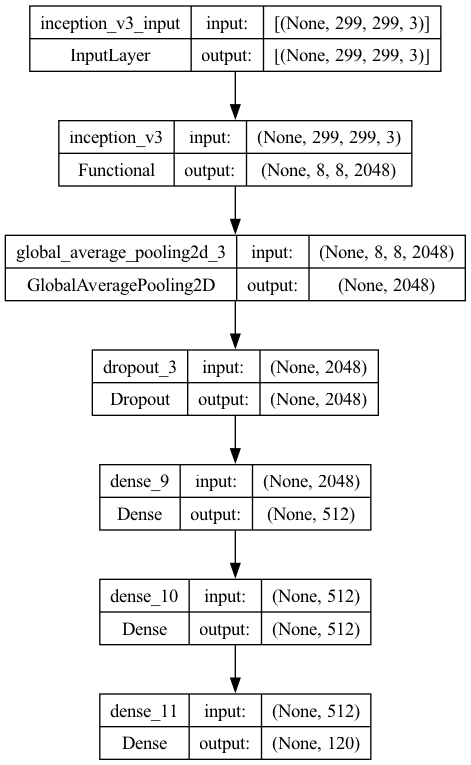

In [103]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

Train Model The batch size is the number of images passed to the model for training during every iteration. Therefore, the number of iterations/steps is the number of images divided by the batch size, which constitues one epoch. After each iteration, weights of the nodes will be updated. An epoch ends when the entire dataset has been passed through. The more epoch we have, the more the model will train on the data.


In [104]:
# Train Model
history = model.fit_generator(train_generator,
                              validation_data=val_generator,
                              epochs=20, verbose=1)

/var/folders/1x/jp3vqcs53vv9kxc9f40hgztc0000gn/T/ipykernel_83253/2381947429.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/20
20/20 [==============================] - 17s 496ms/step - loss: 4.9299 - accuracy: 0.0250 - val_loss: 4.6536 - val_accuracy: 0.0312
Epoch 2/20
20/20 [==============================] - 7s 338ms/step - loss: 4.4684 - accuracy: 0.0844 - val_loss: 4.3926 - val_accuracy: 0.0875
Epoch 3/20
20/20 [==============================] - 7s 322ms/step - loss: 4.0890 - accuracy: 0.1844 - val_loss: 4.1524 - val_accuracy: 0.1562
Epoch 4/20
20/20 [==============================] - 7s 324ms/step - loss: 3.7375 - accuracy: 0.2953 - val_loss: 3.8482 - val_accuracy: 0.2937
Epoch 5/20
20/20 [==============================] - 7s 327ms/step - loss: 3.3981 - accuracy: 0.4031 - val_loss: 3.5514 - val_accuracy: 0.4062
Epoch 6/20
20/20 [==============================] - 7s 320ms/step - loss: 3.0350 - accuracy: 0.4688 - val_loss: 3.2672 - val_accuracy: 0.4375
Epoch 7/20
20/20 [==============================] - 7s 338ms/step - loss: 2.6519 - accuracy: 0.5844 - val_loss: 2.9423 - val_accuracy: 0.5125
Epoch

Accuracy and Loss Plots We made plots of the accuracy and loss for the training and validation data. This gives us an idea of how our model is performing (e.g., underfitting, overfitting).


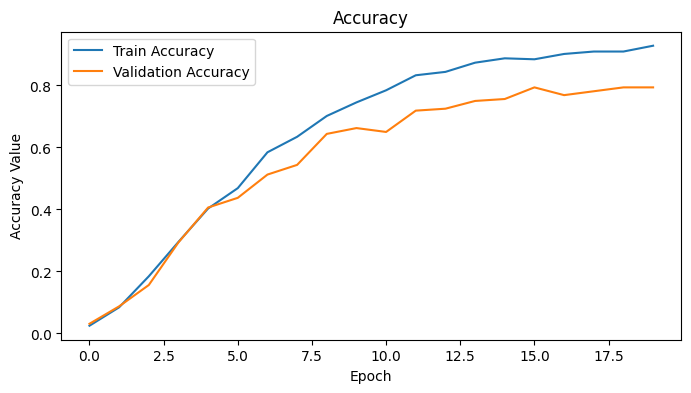

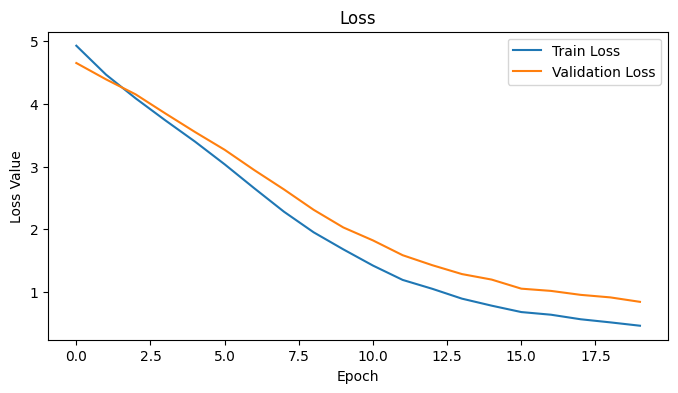

In [105]:
# Plot Accuracy
plt.figure(figsize=(8, 4))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.ylabel('Accuracy Value')
plt.xlabel('Epoch')
plt.title('Accuracy')
plt.legend(loc="best")
plt.show()

# Plot Loss
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.ylabel('Loss Value')
plt.xlabel('Epoch')
plt.title('Loss')
plt.legend(loc="best")
plt.show()

Predicting on Test Set
We then apply our model to a dataset that it has not seen before. This is important, as we want a model that can generalize to other datasets other than what it is trained on. A model that only does well on the training and validation dataset but not on a testing dataset is not a useful one.


In [106]:
# Evaluate Model on Test Data
X_test_rescaled = X_test / 255.  # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(X_test_rescaled)
# get model predictions
# get labels and reverse back to get the text Labels
predictions = le.classes_[np.argmax(test_predictions, axis=1)]
# get target Labels
target_labels = le. classes_[np.argmax(y_test, axis=1)]
# Store in dataframe
predict_df = pd.DataFrame(
    {'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)

7/7 [==============================] - 12s 1s/step


,Target_Labels,Predictions
0,cairn,cairn
1,wire-haired_fox_terrier,wire-haired_fox_terrier
2,Irish_water_spaniel,Irish_water_spaniel
3,Sussex_spaniel,Sussex_spaniel
4,Yorkshire_terrier,Yorkshire_terrier
5,Norwegian_elkhound,Norwegian_elkhound
6,Scotch_terrier,West_Highland_white_terrier
7,curly-coated_retriever,standard_poodle
8,Lakeland_terrier,Lakeland_terrier
9,basset,basset


Model Evaluation Metrics Next, we get a measure of how well our model is performing by calculating the accuracy of the predictions against the actual target_labels.


In [107]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow(X_test, y_test,
                                   batch_size=32)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)

print(f"Test accuracy: {test_acc}")
print(f"Test loss: {test_loss}")

7/7 [==============================] - 3s 357ms/step - loss: 0.8798 - accuracy: 0.8000
Test accuracy: 0.800000011920929
Test loss: 0.8798249959945679


In [108]:
from sklearn.metrics import classification_report

# Print the classification report
print(classification_report(target_labels, predictions))

                                precision    recall  f1-score   support

                  Afghan_hound       1.00      1.00      1.00         2
           African_hunting_dog       1.00      1.00      1.00         2
                      Airedale       1.00      1.00      1.00         1
American_Staffordshire_terrier       0.17      0.50      0.25         2
                   Appenzeller       0.00      0.00      0.00         1
            Bedlington_terrier       1.00      1.00      1.00         2
          Bernese_mountain_dog       1.00      1.00      1.00         1
              Blenheim_spaniel       0.50      1.00      0.67         2
                Border_terrier       1.00      1.00      1.00         1
                   Boston_bull       1.00      1.00      1.00         1
             Brabancon_griffon       1.00      1.00      1.00         1
              Brittany_spaniel       0.00      0.00      0.00         0
                      Cardigan       1.00      0.50      0.67  

/Users/diegobolanos/miniconda/envs/tensorflow_metal/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/diegobolanos/miniconda/envs/tensorflow_metal/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/diegobolanos/miniconda/envs/tensorflow_metal/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _w

Plot Predictions against Actual Labels To better visualize our prediction performance, we plot out a small batch of our testing dataset, together with their actual labels, predictions as well as the probability values that our model predict they are in the category.


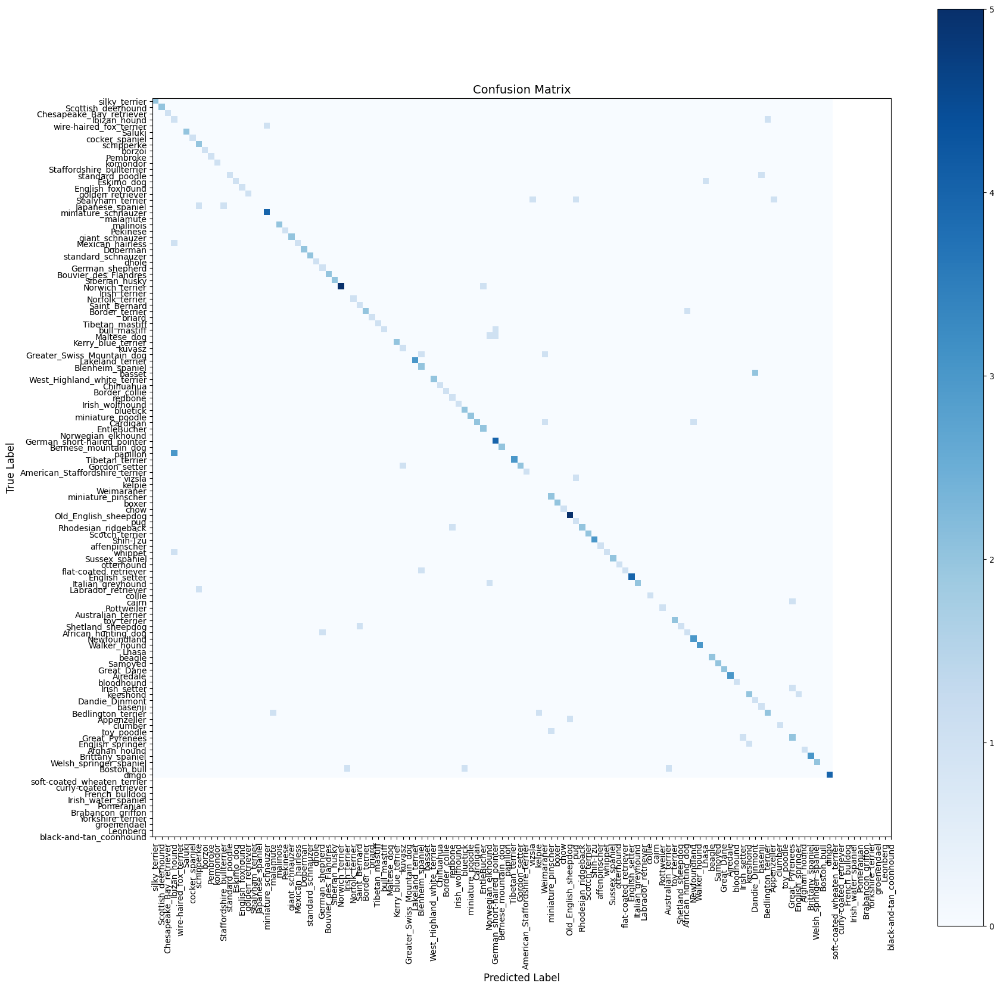

In [109]:
from sklearn.metrics import confusion_matrix

# Create the confusion matrix
cm = confusion_matrix(target_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(20, 20))
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix", fontsize=14)
plt.colorbar()
tick_marks = np.arange(len(breeds))
plt.xticks(tick_marks, breeds, rotation=90, fontsize=10)
plt.yticks(tick_marks, breeds, fontsize=10)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

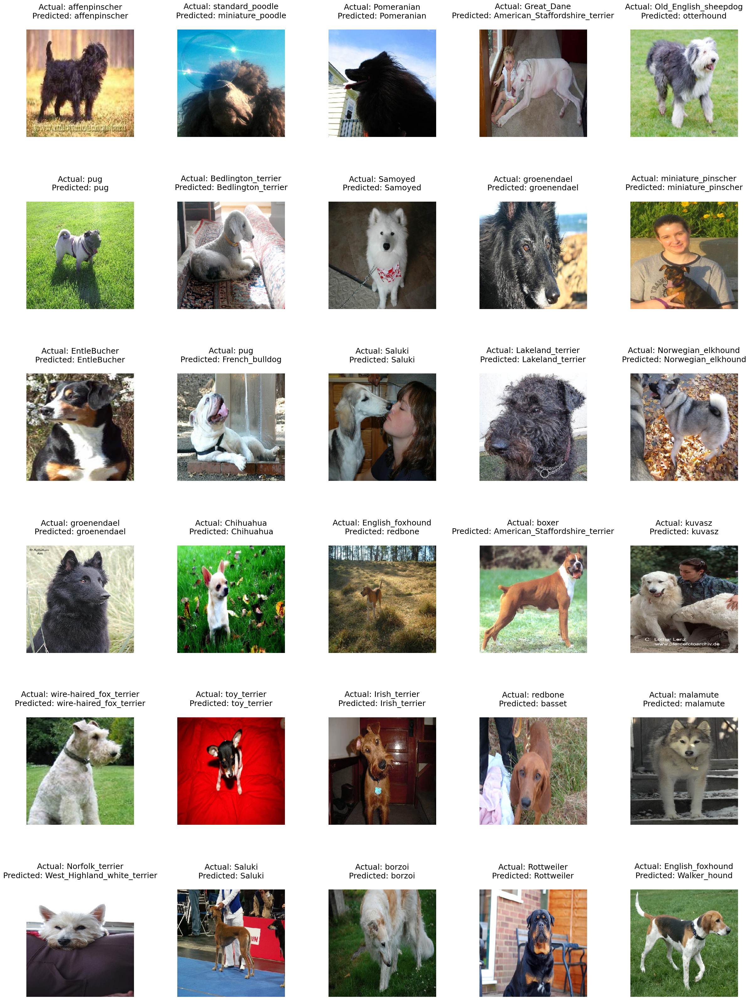

In [110]:
# Plot Actual vs Predicted Images with Confidence Levels
plt.figure(figsize=(30, 40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)):  # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(X_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\n' 'Predicted: ' +
              predicted + '\n', fontsize=18)
plt.show()